### Advanced Machine Learning Final Project: Image Colorization

Group Members: Hayk Ghalechyan, Tigran Hovhannisyan, Aramayis Khachatryan, Anna Titizyan

#### Dataset

For this project, we selected the COCO 2017 dataset, because it contains over 100.000 images with different objects and colors.

After some research we decided to use LAB color space instead of RGB, so we'll need to convert COCO RGB images to LAB

We'll also scale down the images during training due to limited GPU power we have.

In [13]:
from torch.utils.data import Dataset, DataLoader
import torch
import torch.nn as nn
import os

class ColorizationDataset(Dataset):
    def __init__(self, image_dir, image_size=128, max_images=10000):
        self.paths = [os.path.join(image_dir, f) for f in os.listdir(image_dir) if f.endswith(".jpg")][:max_images]
        self.image_size = image_size

    def __len__(self):
        return len(self.paths)

    def __getitem__(self, idx):
        path = self.paths[idx]
        img = imread(path)

        if img.ndim != 3 or img.shape[2] != 3:
            return self.__getitem__((idx + 1) % len(self.paths))

        img = resize(img, (self.image_size, self.image_size), anti_aliasing=True)
        img_lab = rgb2lab(img).astype("float32")

        L = img_lab[:, :, 0] / 100.0
        ab = (img_lab[:, :, 1:] + 128) / 255.0

        L = torch.from_numpy(L).unsqueeze(0)
        ab = torch.from_numpy(ab).permute(2, 0, 1)

        return L, ab

This Dataset converts images to LAB and normalizes them

#### EDA

It's just images 

¯\\_(ツ)_/¯

#### Autoencoder Training

At first we tried to train a simple autoencoder that will that single channel input and give us the A, B values for colorization.
The results were not good so we'll just show you the model architechture and the outputs

In [7]:
class ColorizationAutoencoder(nn.Module):
    def __init__(self):
        super(ColorizationAutoencoder, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 64, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(64, 128, 3, stride=2, padding=1),
            nn.ReLU(),
            nn.Conv2d(128, 256, 3, stride=2, padding=1),
            nn.ReLU()
        )
        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(256, 128, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(128, 64, 3, stride=2, padding=1, output_padding=1),
            nn.ReLU(),
            nn.ConvTranspose2d(64, 2, 3, stride=2, padding=1, output_padding=1),
            nn.Sigmoid()
        )

    def forward(self, x):
        x = self.encoder(x)
        x = self.decoder(x)
        return x

We used MSE loss and Adam optimizer

criterion = nn.MSELoss()

optimizer = torch.optim.Adam(model.parameters(), lr=1e-3)

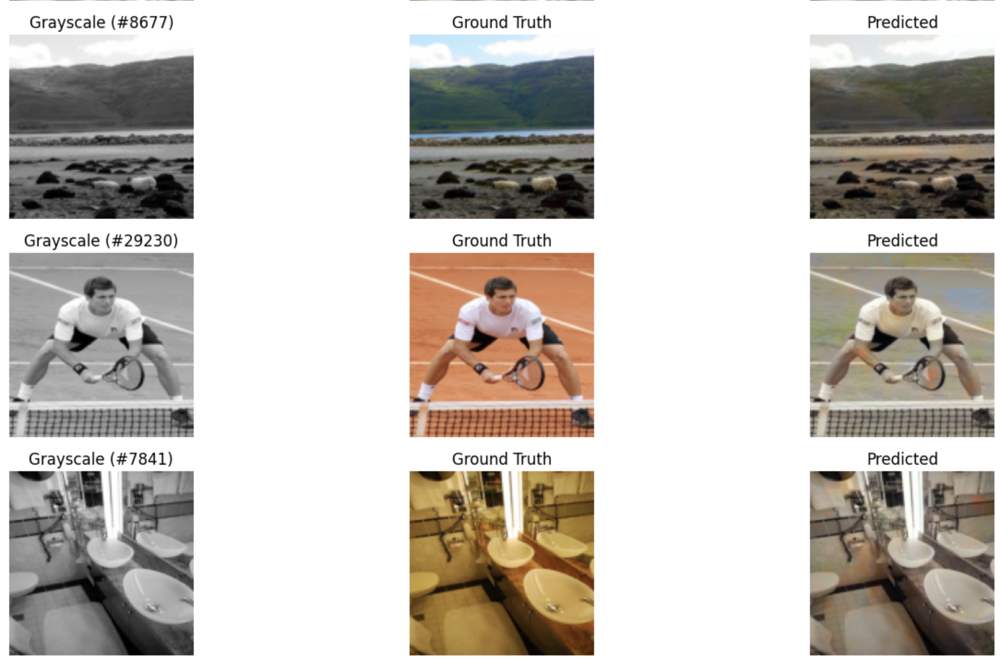

We can clearly see that minimizing L1 or L2 loss is just not enough, because the model just settles on "safe" averages and the results look uninspiring.

After experimenting with basic architectures like autoencoders and researching more advanced approaches, we decided to use a GAN-based architecture for the colorization task.

#### Colorization with Generative Adversarial Networks

Architecture: UNet with Skip Connections + PatchGAN Discriminator

UNet Generator takes in a grayscale image and predicts the missing color channels. It has an encoder–decoder structure with skip connections.

PatchGAN Discriminator focuses on small image patches. It learns to distinguish whether local patches are real or fake (from the generator)

In [9]:
class UNetGenerator(nn.Module):
    def __init__(self):
        super().__init__()
        def block(in_c, out_c):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 3, padding=1),
                nn.ReLU(),
                nn.Conv2d(out_c, out_c, 3, padding=1),
                nn.ReLU()
            )
        self.enc1 = block(1, 64)
        self.pool = nn.MaxPool2d(2)
        self.enc2 = block(64, 128)
        self.enc3 = block(128, 256)
        self.middle = block(256, 512)
        self.up3 = nn.ConvTranspose2d(512, 256, 2, stride=2)
        self.dec3 = block(512, 256)
        self.up2 = nn.ConvTranspose2d(256, 128, 2, stride=2)
        self.dec2 = block(256, 128)
        self.up1 = nn.ConvTranspose2d(128, 64, 2, stride=2)
        self.dec1 = block(128, 64)
        self.final = nn.Conv2d(64, 2, 1)

    def forward(self, x):
        e1 = self.enc1(x)
        e2 = self.enc2(self.pool(e1))
        e3 = self.enc3(self.pool(e2))
        m = self.middle(self.pool(e3))
        d3 = self.dec3(torch.cat([self.up3(m), e3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), e2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), e1], dim=1))
        return self.final(d1)

class PatchDiscriminator(nn.Module):
    def __init__(self, in_channels=3):
        super().__init__()
        def disc_block(in_c, out_c, stride=2):
            return nn.Sequential(
                nn.Conv2d(in_c, out_c, 4, stride, 1),
                nn.BatchNorm2d(out_c),
                nn.LeakyReLU(0.2, inplace=True)
            )
        self.model = nn.Sequential(
            disc_block(in_channels, 64),
            disc_block(64, 128),
            disc_block(128, 256),
            disc_block(256, 512),
            nn.Conv2d(512, 1, 4, 1, 1)
        )

    def forward(self, x):
        return self.model(x)

#### Pytorch Lightning Module

We decided to train our Model using Pytorch Lightning

The discriminator loss is computed as:

$$
\mathcal{L}_{D} = \frac{1}{2} \left[ \text{BCE}(D(\text{real}), 1) + \text{BCE}(D(\text{fake}), 0) \right]
$$

The generator is trained with a combination of adversarial loss and L1 reconstruction loss:

$$
\mathcal{L}_{GAN} = \text{BCE}(D(\text{fake}), 1)
$$

$$
\mathcal{L}_{L1} = \left\| \text{fake}_{ab} - ab \right\|_1
$$

$$
\mathcal{L}_{G} = \mathcal{L}_{GAN} + \lambda_{L1} \cdot \mathcal{L}_{L1}
$$

In [11]:
import pytorch_lightning as pl

class ColorizationGAN(pl.LightningModule):
    def __init__(self, lambda_L1=100.0, lr=2e-4):
        super().__init__()
        self.save_hyperparameters()
        self.G = UNetGenerator()
        self.D = PatchDiscriminator()
        self.criterion_gan = nn.BCEWithLogitsLoss()
        self.criterion_l1 = nn.L1Loss()
        self.automatic_optimization = False

    def forward(self, L):
        return self.G(L)

    def training_step(self, batch, batch_idx):
        opt_g, opt_d = self.optimizers()
        L, ab = batch
        fake_ab = self(L)

        fake_input = torch.cat([L, fake_ab.detach()], dim=1)
        real_input = torch.cat([L, ab], dim=1)

        self.toggle_optimizer(opt_d)
        
        d_real = self.D(real_input)
        d_fake = self.D(fake_input)
        d_loss = 0.5 * (self.criterion_gan(d_real, torch.ones_like(d_real)) +
                        self.criterion_gan(d_fake, torch.zeros_like(d_fake)))

        opt_d.zero_grad(); 
        self.manual_backward(d_loss); 
        opt_d.step()
        self.untoggle_optimizer(opt_d)

        self.toggle_optimizer(opt_g)
        fake_input = torch.cat([L, fake_ab], dim=1)
        d_fake = self.D(fake_input)
        g_gan = self.criterion_gan(d_fake, torch.ones_like(d_fake))
        g_l1 = self.criterion_l1(fake_ab, ab)
        g_loss = g_gan + self.hparams.lambda_L1 * g_l1
        
        opt_g.zero_grad(); self.manual_backward(g_loss); opt_g.step()
        self.untoggle_optimizer(opt_g)

        self.log_dict(
            {"g_loss": g_loss, "d_loss": d_loss, "g_l1": g_l1}, prog_bar=True
        )

    def configure_optimizers(self):
        opt_g = torch.optim.Adam(self.G.parameters(), lr=self.hparams.lr, betas=(0.5, 0.999))
        opt_d = torch.optim.Adam(self.D.parameters(), lr=self.hparams.lr, betas=(0.5, 0.999))
        return [opt_g, opt_d], []
        
    def validation_step(self, batch, batch_idx):
        L, ab = batch
        fake_ab = self(L)
        loss = self.criterion_l1(fake_ab, ab)
        self.log("val_l1", loss, prog_bar=True)

#### Training the Model

We took 50000 images from the dataset. 256x256 size, 128 batch size

90% for training, 10% for validation

We save: Best model (lowest val_l1), Last model (final epoch), into the checkpoints/ directory.

In [21]:
from torch.utils.data import random_split
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint
from pytorch_lightning import Trainer

# Don't throw an error on broken images
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

full_dataset = ColorizationDataset(image_dir="./train2017", image_size=256, max_images=50000)

total_size = len(full_dataset)
train_size = int(0.9 * total_size)
val_size = total_size - train_size

train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

train_dataloader = DataLoader(train_ds, batch_size=128, shuffle=True, num_workers=8, persistent_workers=True)
val_dataloader = DataLoader(val_ds, batch_size=128, shuffle=False, num_workers=8, persistent_workers=True)

model = ColorizationGAN()

logger = TensorBoardLogger("lightning_logs", name="colorization")

val_checkpoint = ModelCheckpoint(
    monitor="val_l1",
    mode="min",
    save_top_k=1,
    save_last=True,
    dirpath="checkpoints",
    filename="val-best-{epoch:02d}-{val_l1:.4f}",
    auto_insert_metric_name=False
)

trainer = Trainer(
    max_epochs=100,
    logger=logger,
    accelerator= "gpu" if torch.cuda.is_available() else "cpu",
    callbacks=[val_checkpoint]
)

# trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

GPU available: True (mps), used: False
TPU available: False, using: 0 TPU cores
HPU available: False, using: 0 HPUs


Here is our Validation L1 loss through epochs

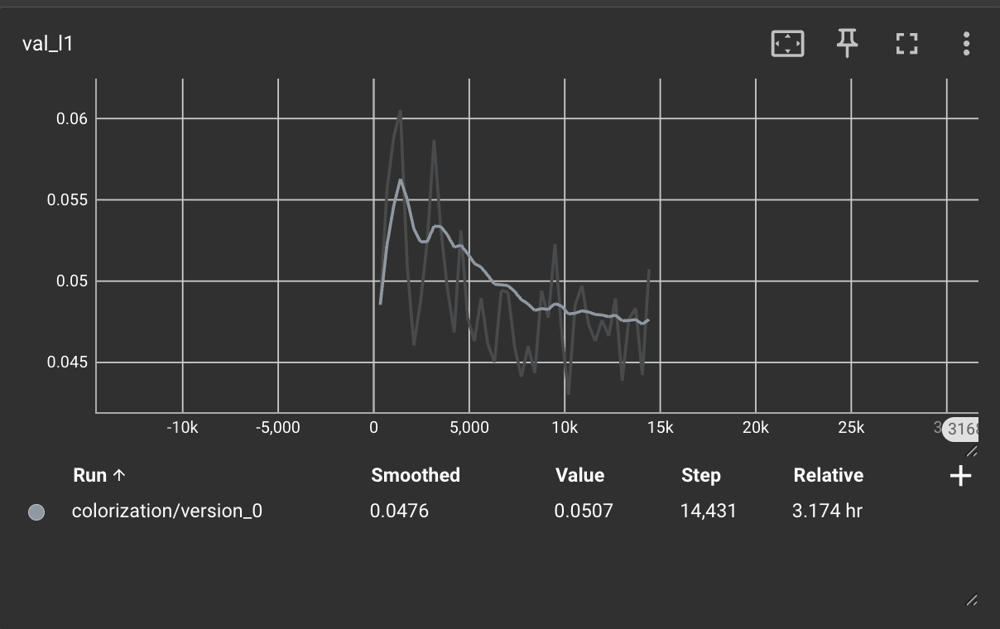

#### Result visualization

In [32]:
import numpy as np
import random
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.transform import resize
from skimage.color import lab2rgb, rgb2lab

def lab_to_rgb_sk(L, ab):
    if torch.is_tensor(L): L = L.detach().cpu().numpy()
    if torch.is_tensor(ab): ab = ab.detach().cpu().numpy()

    L = L[0] * 100
    ab = ab * 255 - 128
    ab = ab.transpose(1, 2, 0)
    lab = np.concatenate([L[:, :, np.newaxis], ab], axis=2)
    rgb = lab2rgb(np.nan_to_num(lab))
    return np.clip(rgb, 0, 1)

In [123]:
model_best = ColorizationGAN.load_from_checkpoint("./checkpoints/best-28-0.0443.ckpt")
model_last = ColorizationGAN.load_from_checkpoint("./checkpoints/last.ckpt")
model_best.eval()
model_last.eval()
pass

/Users/tigranhovhannisyan/Work/Personal/ML/env_3_11/lib/python3.11/site-packages/pytorch_lightning/utilities/migration/utils.py:56: The loaded checkpoint was produced with Lightning v2.5.2, which is newer than your current Lightning version: v2.5.1.post0
/var/folders/c0/zbf_3sv92nl_hnnvxg3lyys00000gn/T/ipykernel_57279/733422954.py:16: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 1 negative Z values that have been clipped to zero
  rgb = lab2rgb(np.nan_to_num(lab))


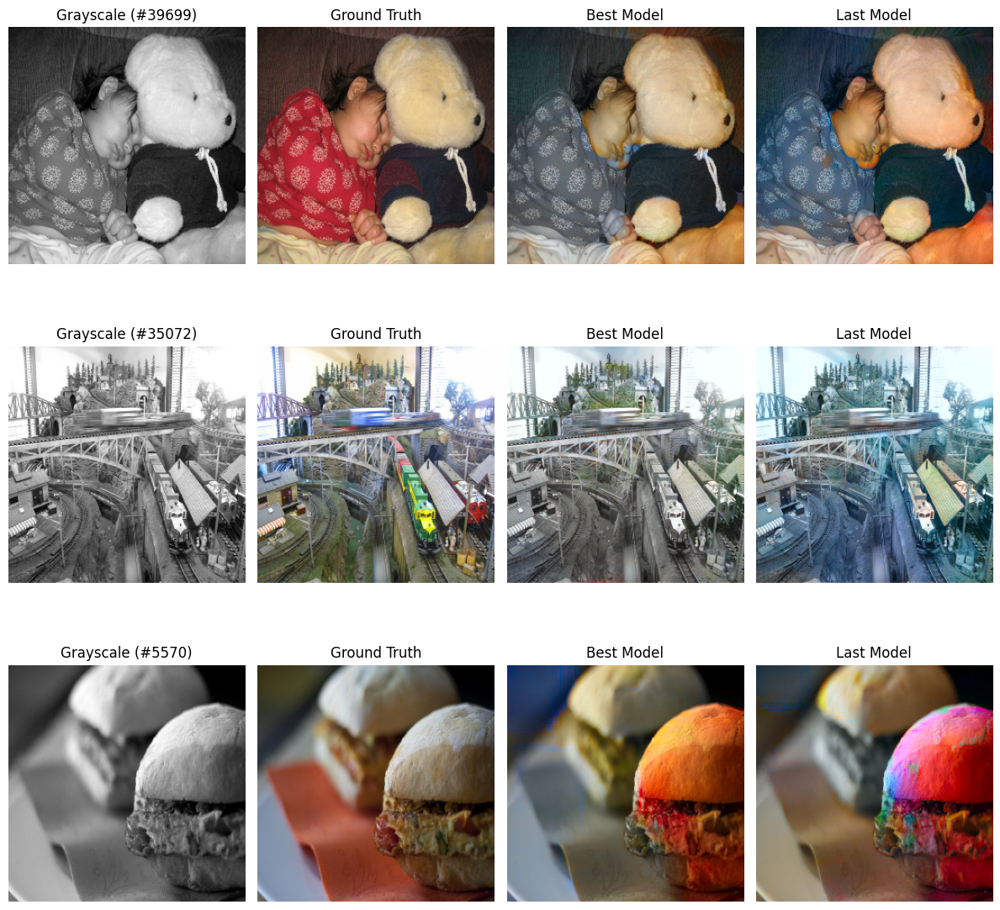

In [72]:
dataset = ColorizationDataset(image_dir="./test2017", image_size=256, max_images=50000)

with torch.no_grad():
    device = "cpu"
    indices = random.sample(range(len(dataset)), 3)
    plt.figure(figsize=(12, 12))

    for i, idx in enumerate(indices):
        L, ab = dataset[idx]

        pred_best_ab = model_best(L.unsqueeze(0).to(device)).cpu()[0]
        pred_last_ab = model_last(L.unsqueeze(0).to(device)).cpu()[0]

        pred_best_rgb = lab_to_rgb_sk(L, pred_best_ab)
        pred_last_rgb = lab_to_rgb_sk(L, pred_last_ab)
        true_rgb = lab_to_rgb_sk(L, ab)

        # Plot Grayscale
        plt.subplot(3, 4, i*4 + 1)
        plt.imshow(L[0], cmap="gray")
        plt.title(f"Grayscale (#{idx})")
        plt.axis("off")

        # Plot Ground Truth
        plt.subplot(3, 4, i*4 + 2)
        plt.imshow(true_rgb)
        plt.title("Ground Truth")
        plt.axis("off")

        # Plot Best Prediction
        plt.subplot(3, 4, i*4 + 3)
        plt.imshow(pred_best_rgb)
        plt.title("Best Model")
        plt.axis("off")

        # Plot Last Prediction
        plt.subplot(3, 4, i*4 + 4)
        plt.imshow(pred_last_rgb)
        plt.title("Last Model")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

In [84]:
import requests
from io import BytesIO
from PIL import Image
import torchvision.transforms as T

def lab_to_rgb_tensor(L, ab):
    L = L * 100
    ab = ab * 255 - 128
    Lab = torch.cat([L, ab], dim=1).permute(0, 2, 3, 1).detach().cpu().numpy()
    rgbs = []
    for img in Lab:
        rgb = lab2rgb(img)
        rgbs.append(rgb)
    rgbs = np.stack(rgbs, axis=0)
    rgbs = torch.from_numpy(rgbs).permute(0, 3, 1, 2).float()
    return rgbs
    
def load_image_from_url(url, image_size=256):
    response = requests.get(url)
    img = Image.open(BytesIO(response.content)).convert("L")
    img = img.resize((image_size, image_size))
    tensor = T.ToTensor()(img)
    return tensor.unsqueeze(0).to(device)


def colorize_image_url(url, model):
    L = load_image_from_url(url)
    with torch.no_grad():
        ab = model(L)[0]
        ab = ab.unsqueeze(0)
        rgb = lab_to_rgb_tensor(L, ab)

    # Display
    plt.figure(figsize=(10, 4))
    plt.subplot(1, 2, 1)
    plt.imshow(L[0][0].cpu().numpy(), cmap="gray")
    plt.title("Input (L)")
    plt.axis("off")

    plt.subplot(1, 2, 2)
    print(rgb.shape)
    plt.imshow(rgb[0].permute(1, 2, 0).cpu().numpy())
    plt.title("Predicted RGB")
    plt.axis("off")

    plt.tight_layout()
    plt.show()

torch.Size([1, 3, 256, 256])


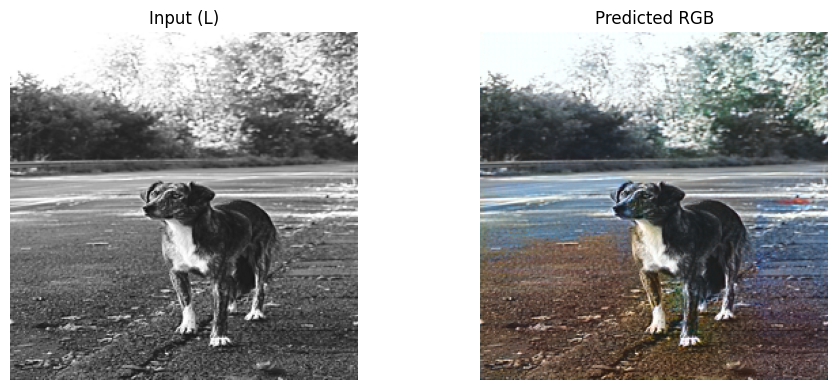

torch.Size([1, 3, 256, 256])


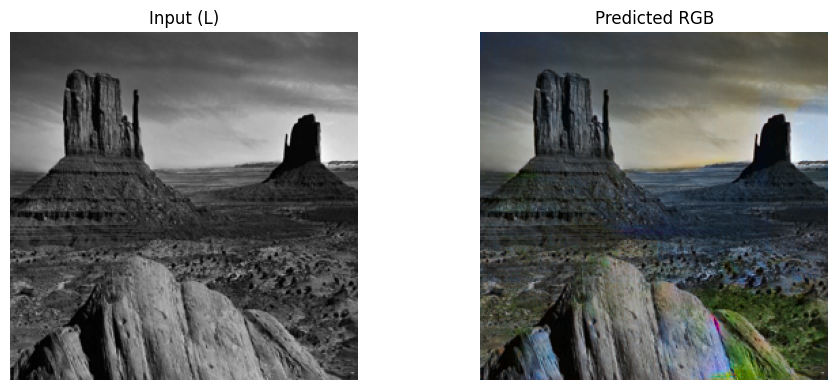

torch.Size([1, 3, 256, 256])


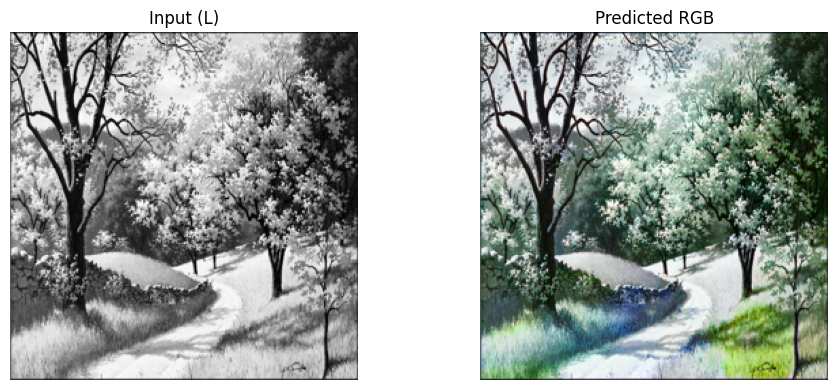

In [124]:
colorize_image_url("https://images.pexels.com/photos/1476244/pexels-photo-1476244.png", model_best)
colorize_image_url("https://braedenk.wordpress.com/wp-content/uploads/2010/10/desert-llndscape2.jpg", model_best)
colorize_image_url("https://raw.githubusercontent.com/deenaariff/GrayScale/master/images/gray.png", model_best)

It's a significant improvement from autoencoder, but the results are still not great.

Next and finally we're gonna try to use the same model but with VGG Perceptual Loss. We'll use the last.ckpt from this model and continue training.


In [87]:
import torchvision.models as models
import torch.nn.functional as F
import torch.nn as nn
import pytorch_lightning as pl

class VGGPerceptualLoss(nn.Module):
    def __init__(self, resize=True):
        super().__init__()
        vgg = models.vgg19(pretrained=True).features[:16].eval()
        for param in vgg.parameters():
            param.requires_grad = False
        self.vgg = vgg
        self.resize = resize
        self.mean = torch.tensor([0.485, 0.456, 0.406]).view(1,3,1,1)
        self.std = torch.tensor([0.229, 0.224, 0.225]).view(1,3,1,1)

    def forward(self, x, y):
        if self.resize:
            x = F.interpolate(x, size=(224, 224), mode='bilinear', align_corners=False)
            y = F.interpolate(y, size=(224, 224), mode='bilinear', align_corners=False)
        x = (x - self.mean.to(x.device)) / self.std.to(x.device)
        y = (y - self.mean.to(y.device)) / self.std.to(y.device)
        return F.l1_loss(self.vgg(x), self.vgg(y))

In [88]:
class ColorizationGANVGG(pl.LightningModule):
    def __init__(self, lambda_L1=100.0, lambda_VGG=10.0, lr=2e-4):
        super().__init__()
        self.save_hyperparameters()
        self.G = UNetGenerator()
        self.D = PatchDiscriminator()
        self.criterion_gan = nn.BCEWithLogitsLoss()
        self.criterion_l1 = nn.L1Loss()
        self.vgg_loss = VGGPerceptualLoss()
        self.automatic_optimization = False

    def forward(self, L):
        return self.G(L)

    def training_step(self, batch, batch_idx):
        opt_g, opt_d = self.optimizers()
        L, ab = batch
        fake_ab = self(L)

        real_input = torch.cat([L, ab], dim=1)
        fake_input = torch.cat([L, fake_ab.detach()], dim=1)

        self.toggle_optimizer(opt_d)
        d_real = self.D(real_input)
        d_fake = self.D(fake_input)
        d_loss = 0.5 * (self.criterion_gan(d_real, torch.ones_like(d_real)) +
                        self.criterion_gan(d_fake, torch.zeros_like(d_fake)))
        opt_d.zero_grad(); self.manual_backward(d_loss); opt_d.step()
        self.untoggle_optimizer(opt_d)

        self.toggle_optimizer(opt_g)
        fake_input = torch.cat([L, fake_ab], dim=1)
        d_fake = self.D(fake_input)
        g_gan = self.criterion_gan(d_fake, torch.ones_like(d_fake))
        g_l1 = self.criterion_l1(fake_ab, ab)

        fake_rgb = lab_to_rgb_tensor(L, fake_ab).to(self.device)
        real_rgb = lab_to_rgb_tensor(L, ab).to(self.device)
        g_vgg = self.vgg_loss(fake_rgb, real_rgb)

        g_loss = g_gan + self.hparams.lambda_L1 * g_l1 + self.hparams.lambda_VGG * g_vgg
        opt_g.zero_grad(); self.manual_backward(g_loss); opt_g.step()
        self.untoggle_optimizer(opt_g)

        self.log_dict({
            "g_loss": g_loss,
            "d_loss": d_loss,
            "g_l1": g_l1,
            "g_vgg": g_vgg
        }, prog_bar=True)

    def validation_step(self, batch, batch_idx):
        L, ab = batch
        fake_ab = self(L)
        fake_rgb = lab_to_rgb_tensor(L, fake_ab).to(self.device)
        real_rgb = lab_to_rgb_tensor(L, ab).to(self.device)
        vgg_loss = self.vgg_loss(fake_rgb, real_rgb)
        self.log("val_g_vgg", vgg_loss, prog_bar=True)

    def configure_optimizers(self):
        opt_g = torch.optim.Adam(self.G.parameters(), lr=self.hparams.lr, betas=(0.5, 0.999))
        opt_d = torch.optim.Adam(self.D.parameters(), lr=self.hparams.lr, betas=(0.5, 0.999))
        return [opt_g, opt_d], []

In [ ]:
import torch
from torch.utils.data import DataLoader
from pytorch_lightning import Trainer
from pytorch_lightning.loggers import TensorBoardLogger
from pytorch_lightning.callbacks import ModelCheckpoint
from torch.utils.data import random_split
import warnings

warnings.filterwarnings("ignore", message="Conversion from CIE-LAB, via XYZ to sRGB color space resulted in .* clipped to zero")

torch.cuda.empty_cache()
from PIL import ImageFile
ImageFile.LOAD_TRUNCATED_IMAGES = True

full_dataset = SimpleColorizationDataset(image_dir="./train2017", image_size=256, max_images=50000)

total_size = len(full_dataset)
train_size = int(0.9 * total_size)
val_size = total_size - train_size

train_ds, val_ds = random_split(full_dataset, [train_size, val_size])

train_dataloader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=8, persistent_workers=True)
val_dataloader = DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=8, persistent_workers=True)

ckpt = torch.load("checkpoints/last.ckpt")
model = ColorizationGANVGG()  # your new model class with vgg_loss
model.load_state_dict(ckpt["state_dict"], strict=False)

logger = TensorBoardLogger("lightning_logs", name="colorization_vgg")

val_checkpoint = ModelCheckpoint(
    monitor="val_g_vgg",
    mode="min",
    save_top_k=1,
    save_last=True,
    dirpath="checkpoints2",
    filename="vgg-val-best-{epoch:02d}-{val_g_vgg:.4f}",
    auto_insert_metric_name=False
)

trainer = Trainer(
    max_epochs=30,
    logger=logger,
    accelerator="gpu" if torch.cuda.is_available() else "cpu",
    callbacks=[val_checkpoint]
)

# trainer.fit(model, train_dataloaders=train_dataloader, val_dataloaders=val_dataloader)

The Validation loss. Decreating but not very stable

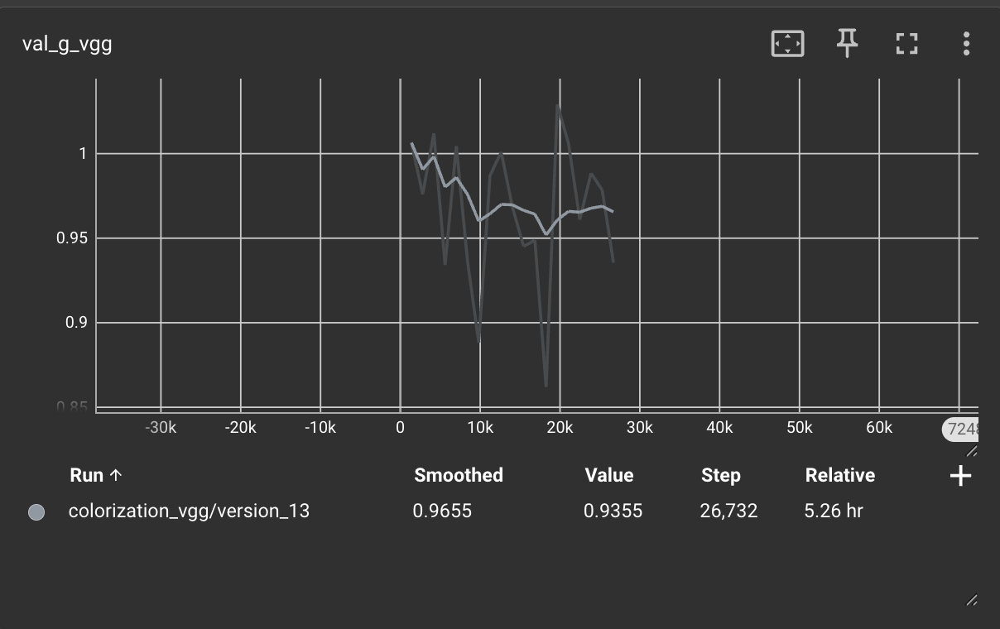

## Final Results

In [118]:
model_best = ColorizationGANVGG.load_from_checkpoint("./checkpoints2/vgg-val-best-12-0.8618.ckpt")
model_last = ColorizationGANVGG.load_from_checkpoint("./checkpoints2/last.ckpt")
model_best.eval()
model_last.eval()
pass

/Users/tigranhovhannisyan/Work/Personal/ML/env_3_11/lib/python3.11/site-packages/pytorch_lightning/utilities/migration/utils.py:56: The loaded checkpoint was produced with Lightning v2.5.2, which is newer than your current Lightning version: v2.5.1.post0
/Users/tigranhovhannisyan/Work/Personal/ML/env_3_11/lib/python3.11/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/Users/tigranhovhannisyan/Work/Personal/ML/env_3_11/lib/python3.11/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=VGG19_Weights.IMAGENET1K_V1`. You can also use `weights=VGG19_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


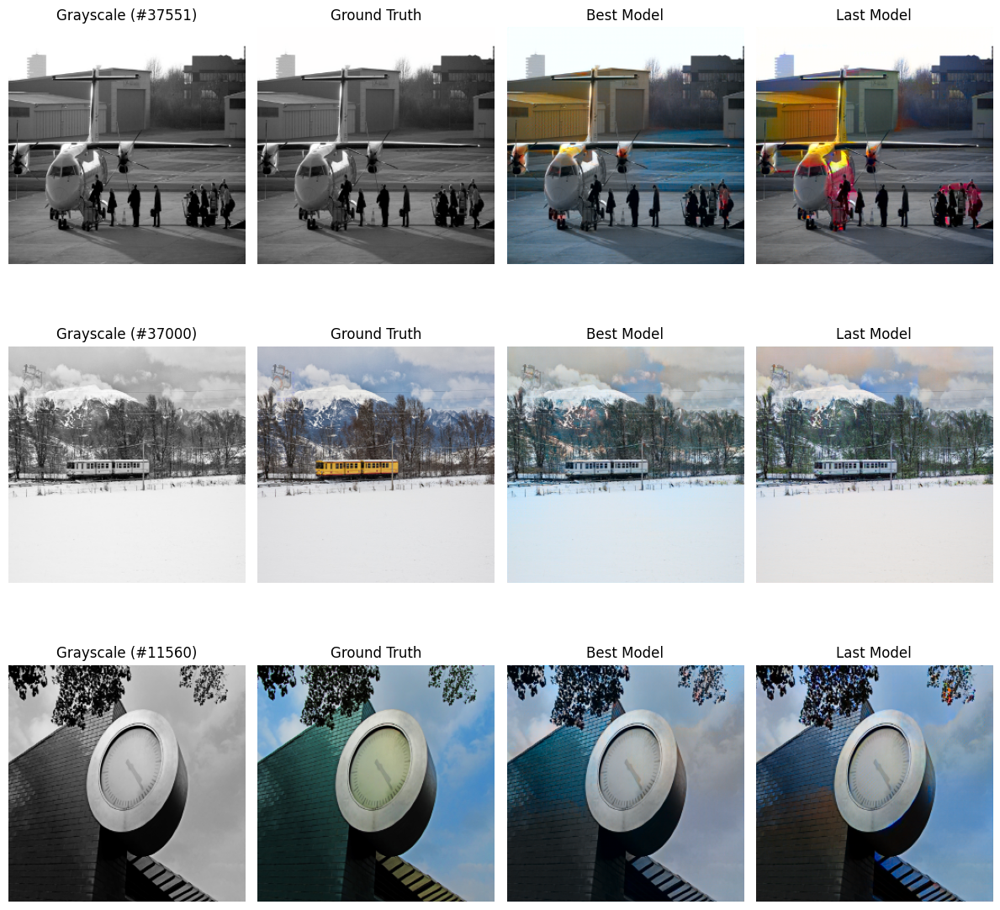

In [110]:
dataset = ColorizationDataset(image_dir="./test2017", image_size=256, max_images=50000)

with torch.no_grad():
    device = "cpu"
    indices = random.sample(range(len(dataset)), 3)
    plt.figure(figsize=(12, 12))

    for i, idx in enumerate(indices):
        L, ab = dataset[idx]

        pred_best_ab = model_best(L.unsqueeze(0).to(device)).cpu()[0]
        pred_last_ab = model_last(L.unsqueeze(0).to(device)).cpu()[0]

        pred_best_rgb = lab_to_rgb_sk(L, pred_best_ab)
        pred_last_rgb = lab_to_rgb_sk(L, pred_last_ab)
        true_rgb = lab_to_rgb_sk(L, ab)

        # Plot Grayscale
        plt.subplot(3, 4, i*4 + 1)
        plt.imshow(L[0], cmap="gray")
        plt.title(f"Grayscale (#{idx})")
        plt.axis("off")

        # Plot Ground Truth
        plt.subplot(3, 4, i*4 + 2)
        plt.imshow(true_rgb)
        plt.title("Ground Truth")
        plt.axis("off")

        # Plot Best Prediction
        plt.subplot(3, 4, i*4 + 3)
        plt.imshow(pred_best_rgb)
        plt.title("Best Model")
        plt.axis("off")

        # Plot Last Prediction
        plt.subplot(3, 4, i*4 + 4)
        plt.imshow(pred_last_rgb)
        plt.title("Last Model")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

torch.Size([1, 3, 256, 256])


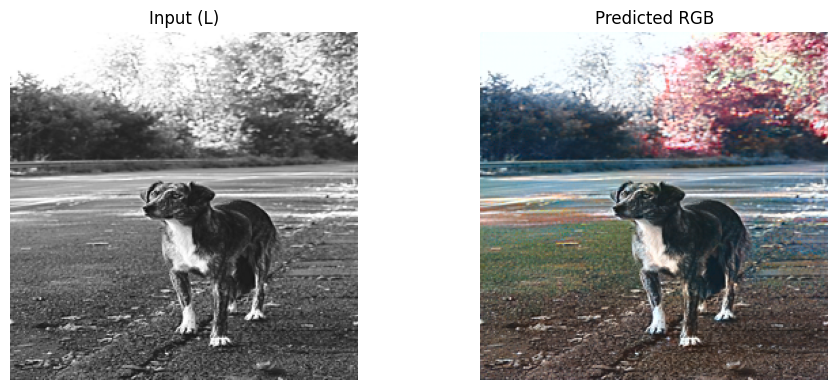

torch.Size([1, 3, 256, 256])


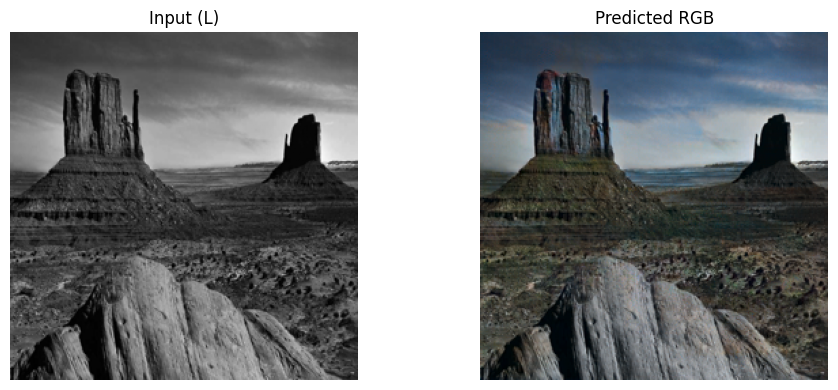

torch.Size([1, 3, 256, 256])


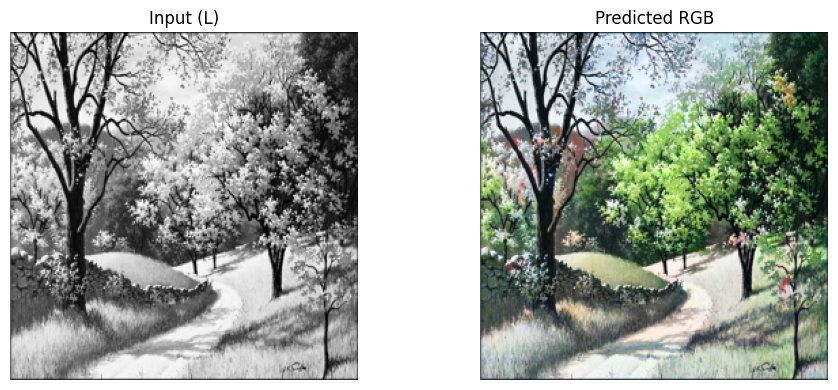

In [121]:
colorize_image_url("https://images.pexels.com/photos/1476244/pexels-photo-1476244.png", model_best)
colorize_image_url("https://braedenk.wordpress.com/wp-content/uploads/2010/10/desert-llndscape2.jpg", model_best)
colorize_image_url("https://raw.githubusercontent.com/deenaariff/GrayScale/master/images/gray.png", model_best)